In [1]:
from plotting import *
from Execute116 import *

In [2]:
from sklearn.manifold import TSNE

In [3]:
sys.path.insert(0, r'C:\Users\viska\Documents\AceCan')
os.chdir(r"C:\Users\viska\Documents\AceCan")
Output_path = r"C:\Users\viska\Documents\AceCan\Prepros"
# os.mkdir(Output_path)
load_data = 1
num = 40
base = 8
topk = 2000
col_range =  [8000]
row_range = [5]
display = 20
pca_comp = 8
d = base ** pca_comp  
data_dir = r'.\bki'    
test =1
name = os.path.join(Output_path, f'b{base}topk{topk}N{num}test{test}')
idx_plot = 3
# os.mkdir(name)
if test:
    pixel = 400*300
else:
    pixel = 1004 * 1344
# os.mkdir(name)

In [4]:
data1Ds, pc, mul_comb = process_dataset(data_dir, base, num, pca_comp, topk, test)

Processing 40 [test :1] images with original size [1004, 1344, 35] 
=============== run step PCA ===============
Explained Variance Ratio [0.759 0.133 0.065 0.025 0.01  0.003 0.002 0.001 0.001 0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   ]


## Check PC Components

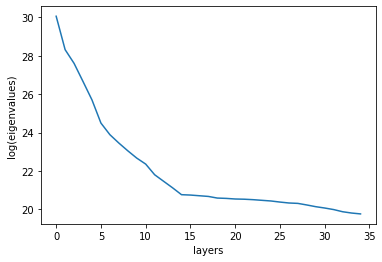

In [5]:
test_mul_comb(mul_comb,pc, pca_comp)

We see around 5-10 pc components.

In [6]:
# pt = Plotting(ver = 1004, hor = 1344)
pt = Plotting()

## Processing PCA

In [7]:
intensity, pca_results = process_pca(data1Ds, pc, num, pca_comp)

========= Intensity ==============


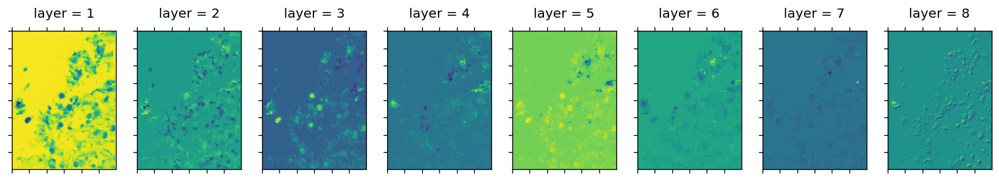

In [8]:
idx = 0
pt.plot_pca_data(pca_results[pixel*idx:pixel*(idx+1), :].T)

## Process Intensity

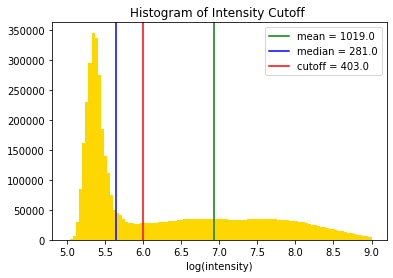

In [9]:
_, cutoffH,_ = get_intensity_hist(intensity, cutoff_log = 6, range = (5,9))

In [10]:
cutoffH

1019.0

In [11]:
stream_1D, norm_data, mask = process_intensity(pca_results, intensity, cutoffH, base, pca_comp)

norm length 1365654
norm_data -0.9995148497417065 0.5559351436146849
rebin, min/mac 0.0 6.0


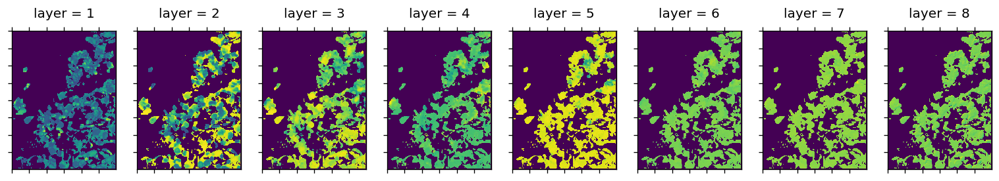

In [12]:
_ = pt.test_norm(norm_data,mask, idx = 0, bg = -1.1 )

rebin, min/mac 0.0 6.0


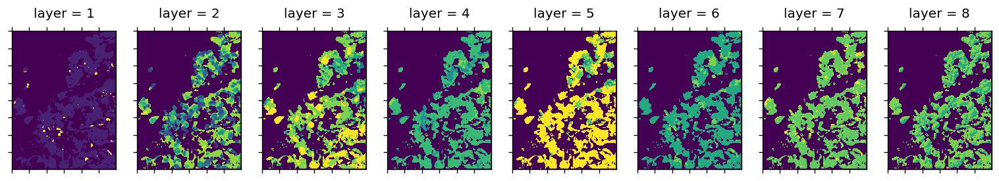

In [13]:
_ = pt.test_rebin(norm_data,mask, idx =0  )

## Counting Heavy Hitters Traditionally

In [14]:
exact_pdh, exact_pd = process_stream_1D(stream_1D, base, pca_comp, topk = 10000, percentage = 0.01)

389.87
#exact_pdh 622 389.87
        0    1    2    3    4    5    6    7   freq       val
0     0.0  5.0  4.0  4.0  4.0  3.0  3.0  4.0  38987   9292072
1     0.0  5.0  3.0  3.0  4.0  4.0  3.0  4.0  28996   9324264
2     0.0  5.0  4.0  3.0  4.0  4.0  3.0  4.0  26291   9324328
3     0.0  5.0  3.0  4.0  4.0  3.0  3.0  4.0  18981   9292008
4     0.0  5.0  4.0  4.0  4.0  4.0  3.0  4.0  17024   9324840
...   ...  ...  ...  ...  ...  ...  ...  ...    ...       ...
2134  0.0  4.0  1.0  3.0  3.0  5.0  3.0  3.0      1   7255648
2135  1.0  4.0  1.0  3.0  3.0  5.0  4.0  4.0      1   9614945
2136  1.0  5.0  3.0  4.0  2.0  4.0  4.0  3.0      1   7481577
2137  0.0  1.0  4.0  4.0  4.0  4.0  3.0  2.0      1   5130504
2138  1.0  1.0  4.0  4.0  3.0  4.0  4.0  5.0      1  11680009

[2139 rows x 10 columns]


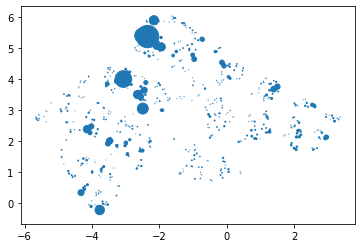

In [15]:
umap_result = process_umap(exact_pdh, pca_comp)


In [16]:
exact_pdh['u1'] = umap_result[:,0] 
exact_pdh['u2'] = umap_result[:,1]
# np.savetxt(f'{name}/exact_pdh.cvs', exact_pdh)


C:\Users\viska\.conda\envs\streaming\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\viska\.conda\envs\streaming\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 604 samples in 0.001s...
[t-SNE] Computed neighbors for 604 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 604 / 604
[t-SNE] Mean sigma: 0.807292
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.914299
[t-SNE] KL divergence after 300 iterations: 1.166664


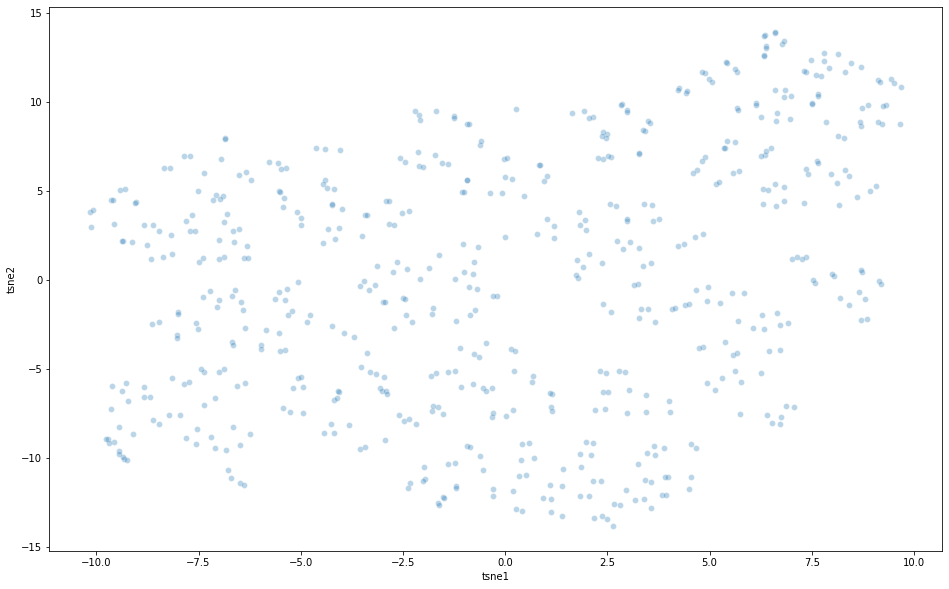

In [66]:
# tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300) 
# tsne_results = tsne.fit_transform(exact_pdh[range(8)])
# exact_pdh['tsne1'] = tsne_results[:,0]
# exact_pdh['tsne2'] = tsne_results[:,1]
# plt.figure(figsize=(16,10))
# sns.scatterplot(
#     x="tsne1", y="tsne2",
# #     hue="y",
#     palette=sns.color_palette("hls", 10),
#     data=exact_pdh,
#     legend="full",
#     alpha=0.3
# )
# # np.savetxt(f'{name}/exact_pdh', exact_pdh)

In [ ]:
np.savetxt(f'{name}/exact_pdh.cvs', exact_pdh)

## K means

In [ ]:
pt.n_hor = 10
pt.n_ver = 4

## 3 clusters

0    1    2    3    4    5    6    7   freq      val        u1        u2  \
0  0.0  5.0  4.0  4.0  4.0  3.0  3.0  4.0  38987  9292072 -2.348392  5.366735   
1  0.0  5.0  3.0  3.0  4.0  4.0  3.0  4.0  28996  9324264 -3.066481  3.994495   
2  0.0  5.0  4.0  3.0  4.0  4.0  3.0  4.0  26291  9324328 -2.504678  5.396258   
3  0.0  5.0  3.0  4.0  4.0  3.0  3.0  4.0  18981  9292008 -2.490305  3.041360   
4  0.0  5.0  4.0  4.0  4.0  4.0  3.0  4.0  17024  9324840 -2.283216  5.350939   

   kmean  k3  
0      1   3  
1      1   3  
2      1   3  
3      1   3  
4      1   3  


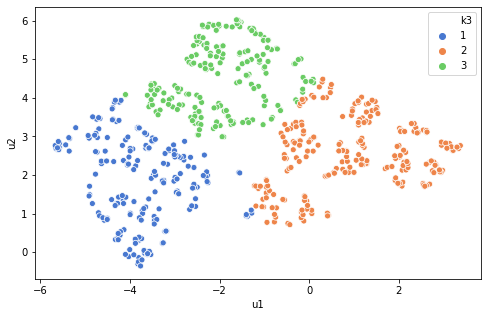

In [172]:
process_kmean(exact_pdh, k_cluster = 'k3', N_cluster = 3)

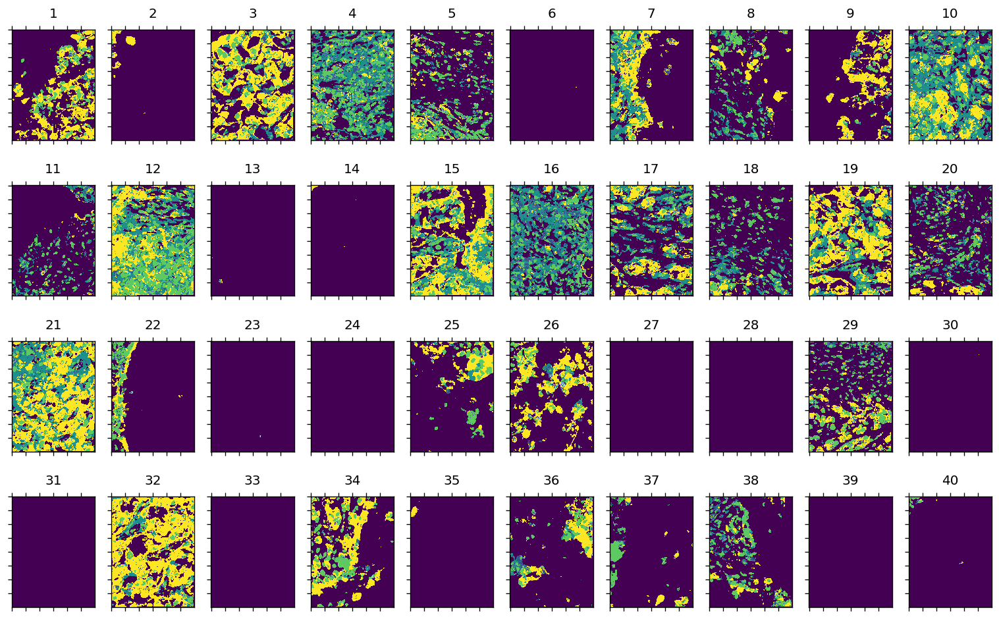

In [171]:
# 3 clulsters
final_umap, _ = plot_kmean_clusters(stream_1D, mask, exact_pdh, color = 4, sgn = 1  )
pt.plot_masked(final_umap)

## 10 clusters

In [175]:
exact_pdh.loc[[0,1]]

,0,1,2,3,4,5,6,7,freq,val,u1,u2,kmean,k3,k10
0,0.0,5.0,4.0,4.0,4.0,3.0,3.0,4.0,38987,9292072,-2.348392,5.366735,1,3,6
1,0.0,5.0,3.0,3.0,4.0,4.0,3.0,4.0,28996,9324264,-3.066481,3.994495,1,3,2


0    1    2    3    4    5    6    7   freq      val        u1        u2  \
0  0.0  5.0  4.0  4.0  4.0  3.0  3.0  4.0  38987  9292072 -2.348392  5.366735   
1  0.0  5.0  3.0  3.0  4.0  4.0  3.0  4.0  28996  9324264 -3.066481  3.994495   
2  0.0  5.0  4.0  3.0  4.0  4.0  3.0  4.0  26291  9324328 -2.504678  5.396258   
3  0.0  5.0  3.0  4.0  4.0  3.0  3.0  4.0  18981  9292008 -2.490305  3.041360   
4  0.0  5.0  4.0  4.0  4.0  4.0  3.0  4.0  17024  9324840 -2.283216  5.350939   

   kmean  k3  k10  
0      1   3    6  
1      1   3    2  
2      1   3    6  
3      1   3    2  
4      1   3    6  


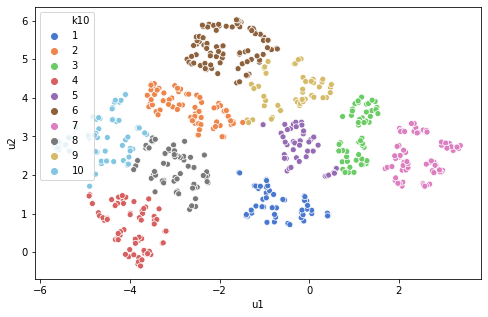

In [178]:
process_kmean(exact_pdh, k_cluster = 'k10', N_cluster = 10)

In [187]:
cancer_clu = [3,7]
k = 'k10'

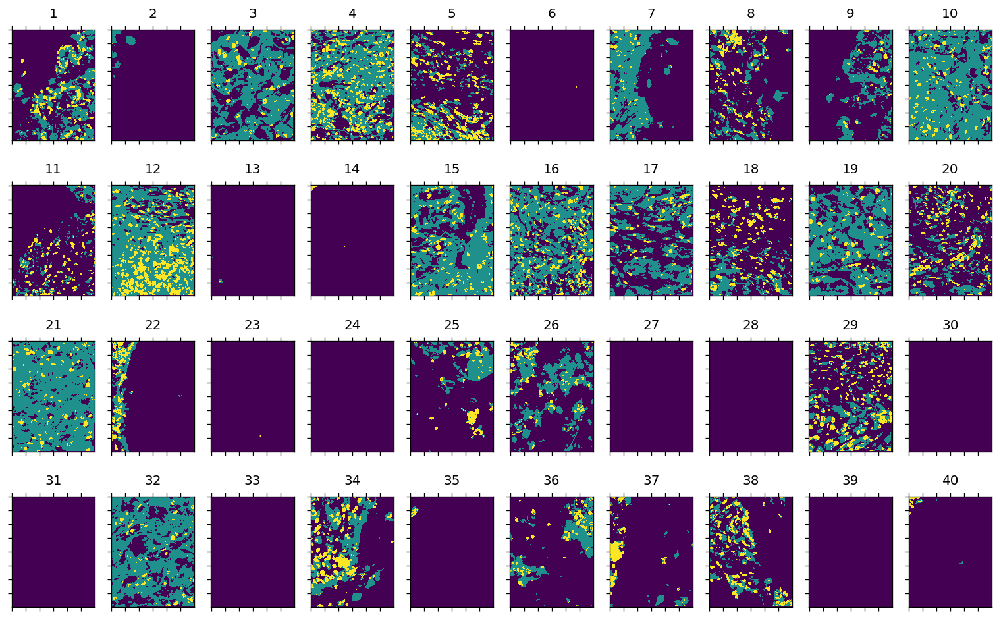

In [188]:
HHvals_c2 = exact_pdh.loc[ exact_pdh[k].eq(cancer_clu[0]) | exact_pdh[k].eq(cancer_clu[1]), 'val'].values
final_umap, masked_streams  = plot_kmean_binary(stream_1D, mask, HHvals_c2)
pt.plot_masked(final_umap)
# top 2 cancer cell clusterse

## Gluviz Clustering

In [31]:
from glue.core.state import load

In [40]:
data_collection = load(f'{name}\\make_plot.py.data')
data0 = data_collection[0]
# FIND ORDER
sub_range = [0,1,2,3,4,7,6,5]
for subset in sub_range:
    layer_data = data0.subsets[subset]
    print(subset,layer_data['col13'][:10])

In [119]:
cluster = {}
i = 1
for subset in sub_range:
    layer_data = data0.subsets[subset]
    cluster[i] = layer_data['col13'].astype(int)
    i+=1
exact_pdh['cluster'] = np.zeros(len(exact_pdh)).astype(int)
for key in range(1,max(sub_range)+2):
    exact_pdh.loc[cluster[key],'cluster'] = int(key)

In [120]:
exact_pdh
# exact_pdh = exact_pdh.drop(['idx'], axis = 1)

,0,1,2,3,4,5,6,7,freq,val,u1,u2,cluster
0,0.0,5.0,4.0,4.0,4.0,3.0,3.0,4.0,49875,9292072,1.063387,5.582517,1
1,0.0,5.0,3.0,3.0,4.0,4.0,3.0,4.0,39918,9324264,-0.100575,4.324712,2
2,0.0,5.0,4.0,3.0,4.0,4.0,3.0,4.0,32220,9324328,1.158824,5.578264,1
3,0.0,4.0,3.0,3.0,4.0,4.0,3.0,4.0,28804,9324256,1.425807,3.109318,3
4,0.0,4.0,3.0,4.0,3.0,3.0,3.0,4.0,28127,9287904,1.616792,3.802155,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
599,0.0,5.0,2.0,2.0,3.0,3.0,3.0,4.0,519,9286824,-0.809919,3.296828,0
600,0.0,2.0,2.0,4.0,3.0,4.0,3.0,4.0,513,9320592,2.319675,1.000238,0
601,0.0,4.0,5.0,3.0,4.0,4.0,3.0,3.0,508,7227232,2.441728,5.405262,0
602,0.0,3.0,3.0,4.0,2.0,3.0,3.0,4.0,505,9283800,2.696003,3.312973,0


In [294]:
def plot_umap_clusters(stream_1D, mask, exact_pdhh, val = 'val', cluster = 'cluster' bg = -1, color = 8 ):
    HHvals = np.array(exact_pdhh[val])
    HHcluster = np.array(exact_pdhh[cluster])
    masked_streams = np.zeros(np.shape(stream_1D))
    for idx, val in enumerate( HHvals): 
        label = HHcluster[idx]
        masked_streams = np.where(stream_1D != val, masked_streams, label)
    final_umap = np.ones(mask.shape) * bg
    binary_umap = np.ones(mask.shape) * bg
    masked_binary = (masked_streams > 0) * 1
    final_umap[mask] = masked_streams
    binary_umap[mask] = masked_binary
    return final_umap, binary_umap,  masked_streams 

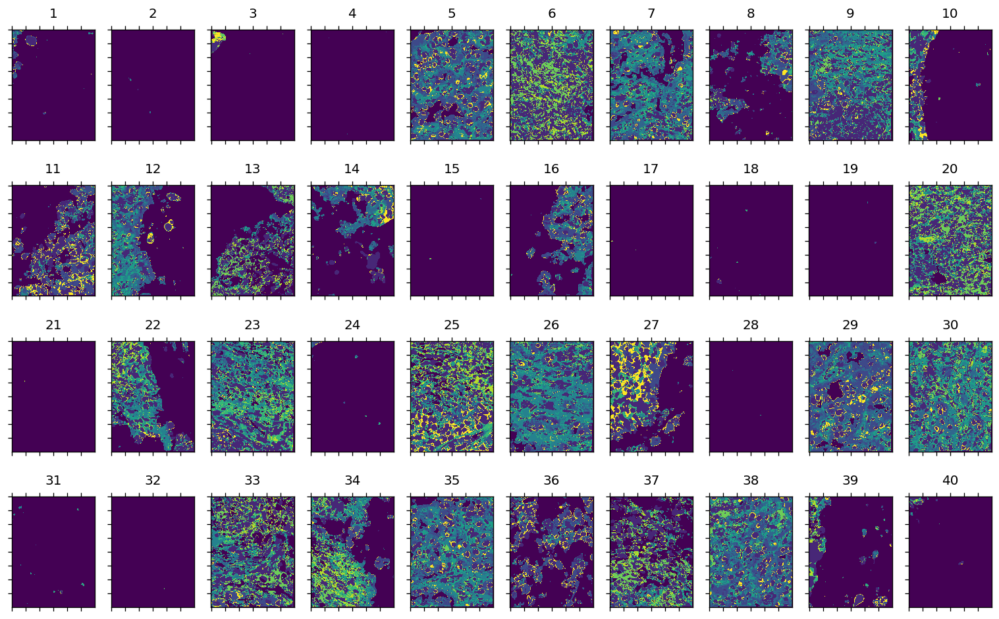

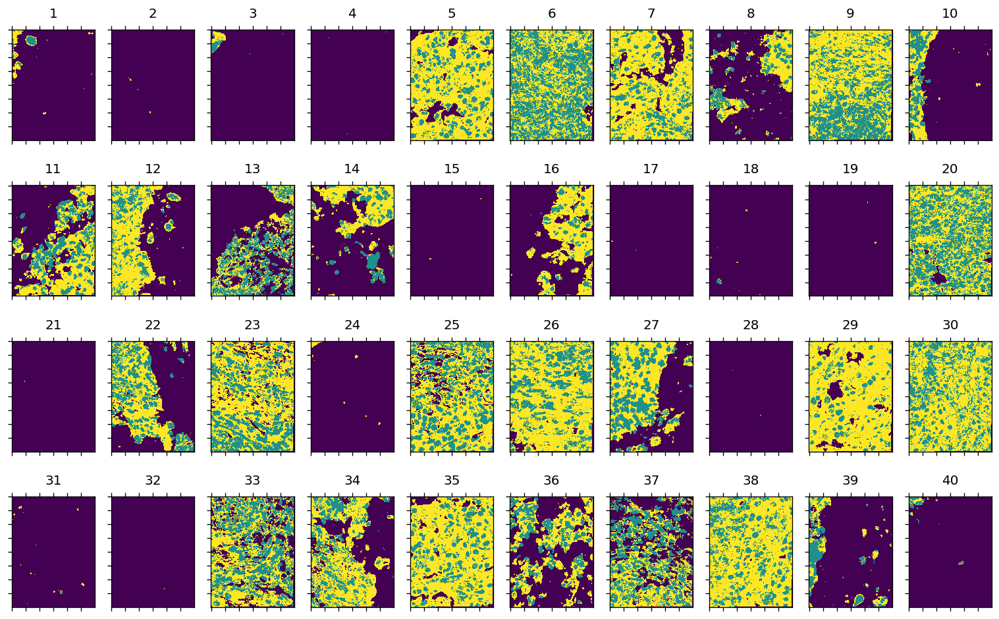

In [138]:
exact_pdhh = exact_pdh
final_umap, binary_umap, masked_streams  = plot_umap_clusters(stream_1D, exact_pdhh)
pt.plot_masked(final_umap)
pt.plot_masked(binary_umap)

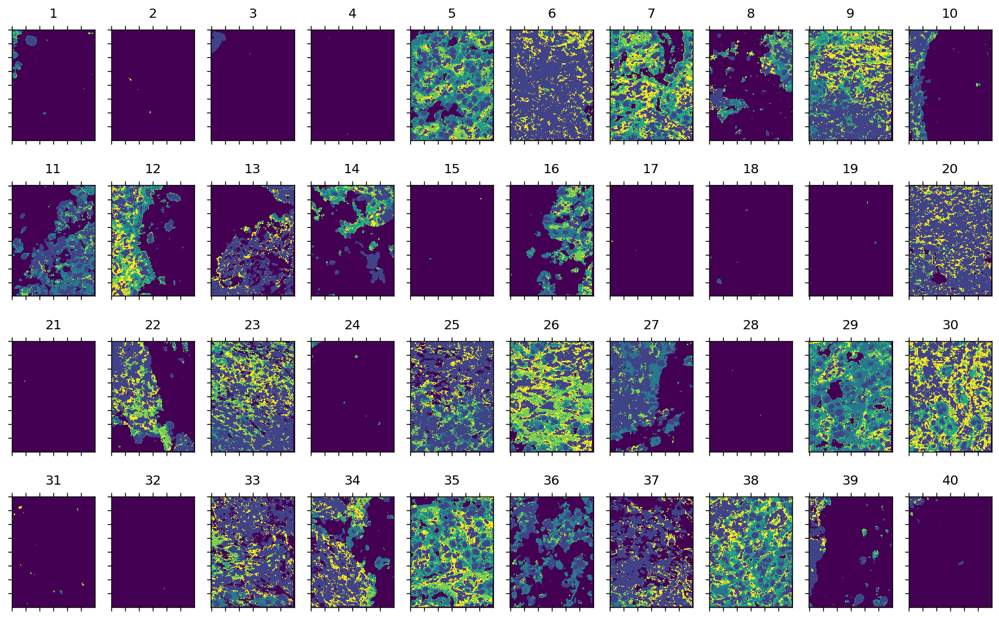

In [136]:
# exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] > 1]
# exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] < 5]
exact_pdhh = exact_pdh
final_umap, binary_umap, masked_streams  = plot_umap_clusters(stream_1D, exact_pdhh)
pt.plot_masked(final_umap)
# cluster 2 pos

## K-means

In [143]:
from sklearn.cluster import KMeans
import seaborn as sns
def process_kmean(exact_pdh, u1 = 'u1', u2 = 'u2', k_cluster = 'kmean', weighted = False, N_cluster = 8):
    kmeans = KMeans(n_clusters=N_cluster)
    if weighted:
        weight = exact_pdh['freq'].values
    else:
        weight = None
    umap_result = exact_pdh.loc[:,[u1, u2 ]].values
    kmeans.fit(umap_result, sample_weight = weight)
    y_km = kmeans.predict(umap_result)
    exact_pdh[k_cluster] = y_km + 1
    print(exact_pdh.head())
    plt.figure(figsize=(8,5))
    sns.scatterplot(
        x=u1, y=u2,
        hue= k_cluster,
        palette=sns.color_palette("muted", N_cluster),
        data=exact_pdh,
        legend="full",
        # alpha=0.3
    )
    return None  

0    1    2    3    4    5    6    7   freq      val        u1        u2  \
0  0.0  5.0  4.0  4.0  4.0  3.0  3.0  4.0  38987  9292072 -2.348392  5.366735   
1  0.0  5.0  3.0  3.0  4.0  4.0  3.0  4.0  28996  9324264 -3.066481  3.994495   
2  0.0  5.0  4.0  3.0  4.0  4.0  3.0  4.0  26291  9324328 -2.504678  5.396258   
3  0.0  5.0  3.0  4.0  4.0  3.0  3.0  4.0  18981  9292008 -2.490305  3.041360   
4  0.0  5.0  4.0  4.0  4.0  4.0  3.0  4.0  17024  9324840 -2.283216  5.350939   

   kmean  
0      2  
1      2  
2      2  
3      2  
4      2  


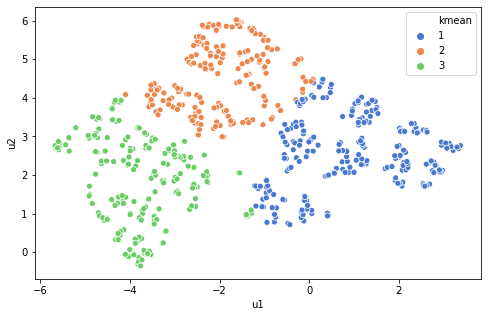

In [144]:
process_kmean(exact_pdh, N_cluster = 3)

In [155]:
def plot_kmean_clusters(stream_1D, mask, exact_pdhh, val = 'val', cluster = kmean, bg = -1, color = 0, sgn = -1 ):
    HHvals = np.array(exact_pdhh[val])
    HHcluster = np.array(exact_pdhh[cluster])
    masked_streams = np.zeros(np.shape(stream_1D))
    for idx, val in enumerate( HHvals): 
        label = HHcluster[idx]
        masked_streams = np.where(stream_1D != val, masked_streams, color -sgn * label)
    final_umap = np.ones(mask.shape) * bg
    final_umap[mask] = masked_streams
    return final_umap, masked_streams 

def plot_kmean_binary(stream_1D, mask, HHvals, val = 'val', cluster = kmean, bg = -1, color = 1 ):
    masked_streams = np.zeros(np.shape(stream_1D))
    for val in HHvals: 
        masked_streams = np.where(stream_1D != val, masked_streams, color)
    final_umap = np.ones(mask.shape) * bg
    # binary_umap = np.ones(mask.shape) * bg
    # masked_binary = (masked_streams > 0) * 1
    final_umap[mask] = masked_streams
    # binary_umap[mask] = masked_binary
    return final_umap, masked_streams 

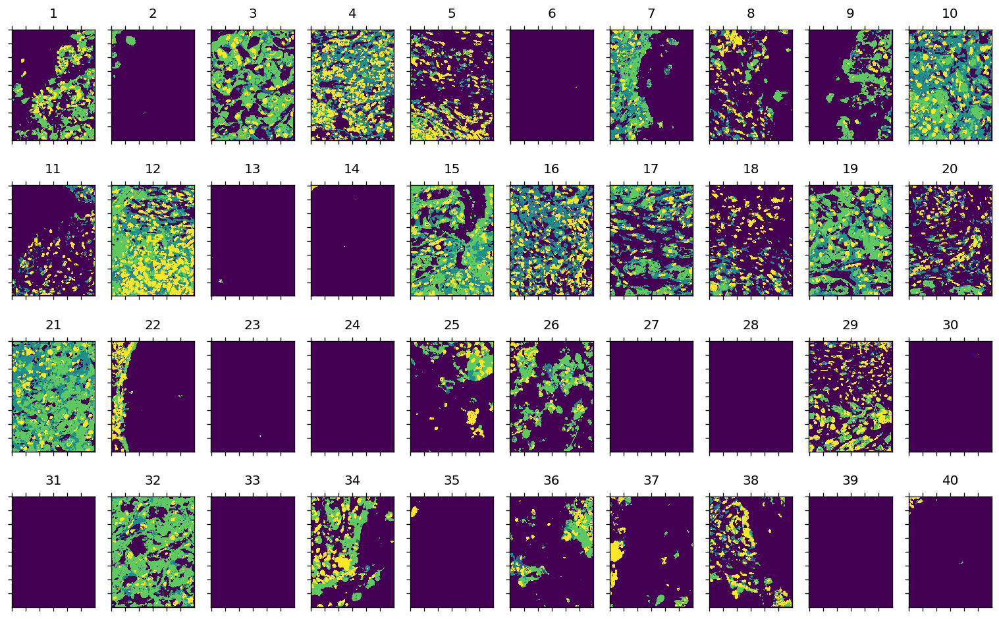

In [156]:
# 3 clulsters
final_umap, _ = plot_kmean_clusters(stream_1D, mask, exact_pdh, color = 4, sgn = 1  )
pt.plot_masked(final_umap)

## Right side cancer cell clusters

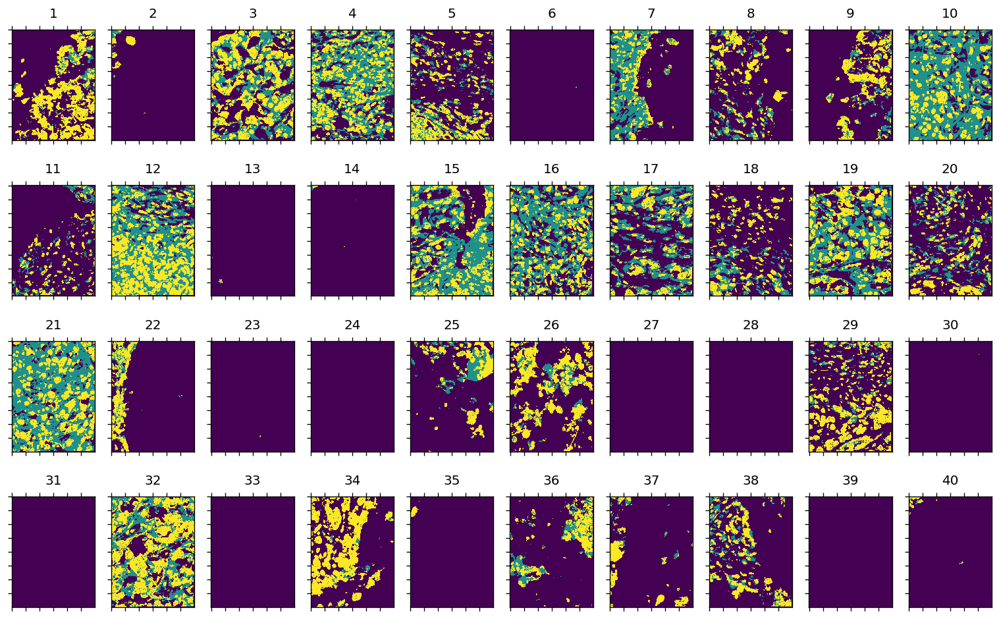

In [96]:
pt.n_hor = 10
pt.n_ver = 4
HHvals_c4 = exact_pdh.loc[ exact_pdh.kmean.eq(2) |exact_pdh.kmean.eq(5)| exact_pdh.kmean.eq(4)|exact_pdh.kmean.eq(8), 'val'].values
final_umap, masked_streams  = plot_kmean_binary(stream_1D, mask, HHvals_c4)
pt.plot_masked(final_umap)
# cluster 2, 5, 8, 4

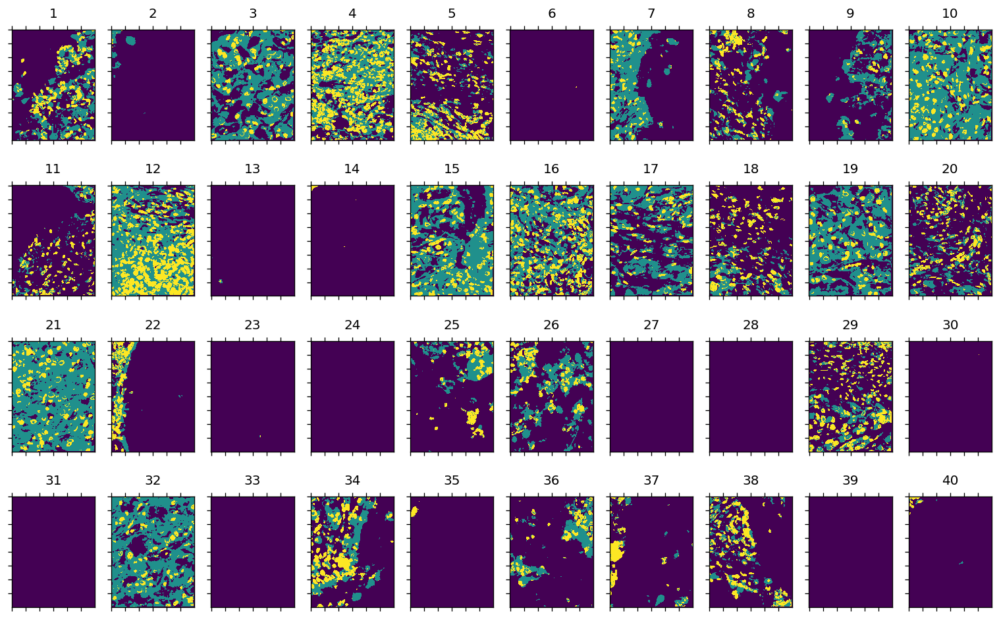

In [98]:
pt.n_hor = 10
pt.n_ver = 4
HHvals_c3 = exact_pdh.loc[ exact_pdh.kmean.eq(2) |exact_pdh.kmean.eq(5)| exact_pdh.kmean.eq(8), 'val'].values
final_umap, masked_streams  = plot_kmean_binary(stream_1D, mask, HHvals_c3)
pt.plot_masked(final_umap)
# cluster 2, 5, 8

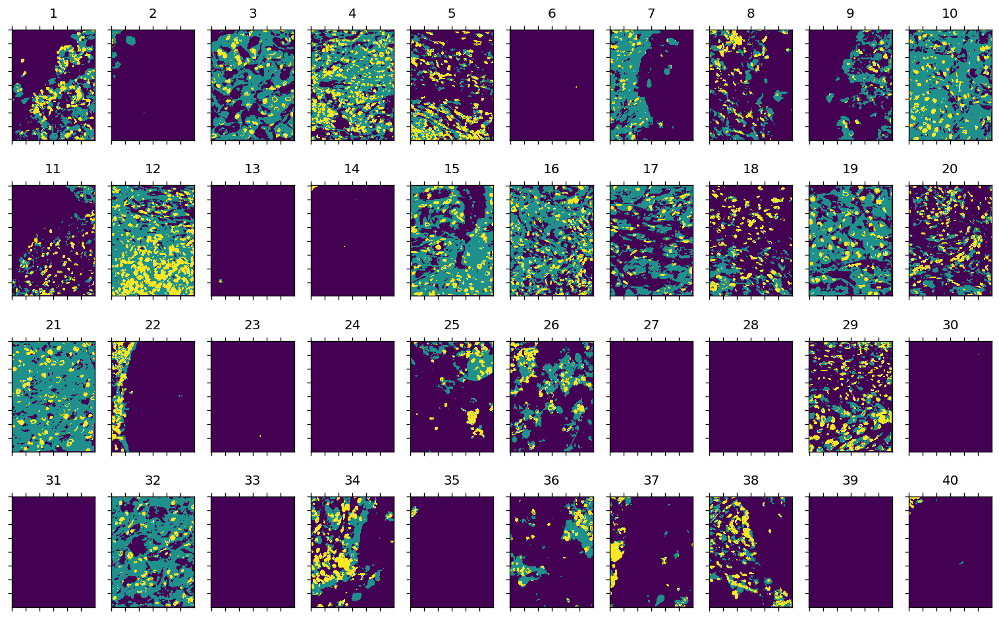

In [99]:
pt.n_hor = 10
pt.n_ver = 4
HHvals_c2 = exact_pdh.loc[ exact_pdh.kmean.eq(2) | exact_pdh.kmean.eq(8), 'val'].values
final_umap, masked_streams  = plot_kmean_binary(stream_1D, mask, HHvals_c2)
pt.plot_masked(final_umap)
# cluster 2, 8

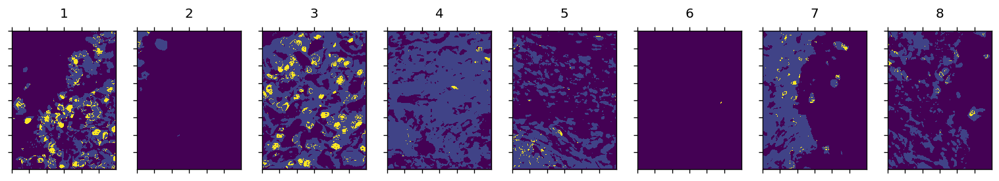

In [40]:
exact_pdhh = exact_pdh.loc[exact_pdh[kmean] == 4]
# exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] < 5]
# exact_pdhh = exact_pdh
final_umap, masked_streams  = plot_kmean_clusters(stream_1D, mask, exact_pdhh)
pt.plot_masked(final_umap)
# cluster 2 pos

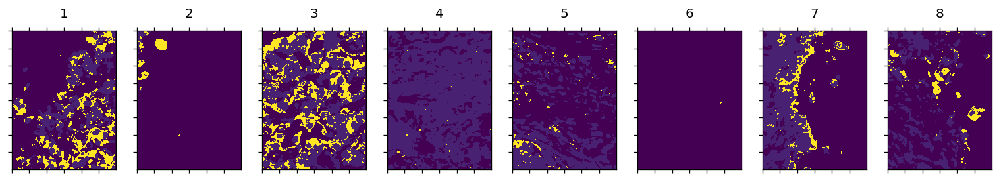

In [46]:
exact_pdhh = exact_pdh.loc[exact_pdh[kmean] == 10]
# exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] < 5]
# exact_pdhh = exact_pdh
final_umap, masked_streams  = plot_kmean_clusters(stream_1D, mask, exact_pdhh)
pt.plot_masked(final_umap)
# cluster 2 pos